# Imports

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
import kagglehub  # for dataset
import os
import string
import torch
import random
from sklearn.utils import shuffle
from collections import defaultdict
import math
from math import ceil

In [ ]:
try:
    import mido  # for parsing midi files
    from mido import MidiFile, MidiTrack, Message, MetaMessage
except ModuleNotFoundError:
    !pip install mido
    import mido
    from mido import MidiFile, MidiTrack, Message, MetaMessage

In [ ]:
try:
    from midi2audio import FluidSynth
    from IPython import display
except ModuleNotFoundError:
    !apt install fluidsynth
    !pip install --upgrade pyfluidsynth
    !pip install midi2audio
    from midi2audio import FluidSynth
    from IPython import display

# Display Functions

In [ ]:
def play_midi(path: str, name: str = 'tmp.wav') -> display.Audio:
    """
    Function from CSC311 lab 6.
    Displays a playable wav of the given midi file.
    """
    FluidSynth("font.sf2").midi_to_audio(path, f'/content/{name}.wav')
    return display.Audio(f'/content/{name}.wav')

In [ ]:
def display_piano_roll(piano_roll: np.ndarray, name: str) -> None:
    """
    https://medium.com/analytics-vidhya/convert-midi-file-to-numpy-array-in-python-7d00531890c
    :param piano_roll:
    """
    plt.plot(range(piano_roll.shape[0]), np.multiply(piano_roll, range(lowest_note, piano_roll.shape[1] + lowest_note)), marker='.', markersize=1, linestyle='')
    plt.title(name)
    plt.xlabel('time step')
    plt.ylabel('note')
    plt.ylim(bottom=1)
    plt.show()

# Midi Functions

code modified from: https://raw.githubusercontent.com/TianyangZhan/AutoMusicGeneration/refs/heads/master/midi_parser.py

In [312]:
# GLOBAL PARAMETERS
unit_time = 0.02  # seconds, time unit for time slice (column in the piano roll)
# highest_note = 108  # pitch value C8
# lowest_note = 21  # pitch value A0
highest_note = 127  # pitch value C8
lowest_note = 0  # pitch value A0
pitch_dimension = highest_note - lowest_note + 1

In [ ]:
def parseMidi(midi_file: str) -> tuple[np.ndarray, int, int]:
    """
    parse midi file into a piano roll and save temporal values

    :param midi_file: path to midi file for parsing

    :return: (piano_roll, tempo, resolution)
        -> piano_roll: a matrix of size (time_step x pitch_dimension)
        -> tempo: the tempo value from midi file
        -> resolution: the resolution value from midi file
    """
    midi_data = MidiFile(midi_file)

    # get music tempo info
    resolution = midi_data.ticks_per_beat

    track_tempos = [0]
    for track in midi_data.tracks:
        for event in track:
            if str(event.type) != 'set_tempo':
                continue
            track_tempos.append(event.tempo)
    tempo = int(60000000 / max(track_tempos))  # get the max track tempo

    ticks_per_time = resolution * tempo * unit_time / 60.0

    #Get maximum ticks across all tracks
    total_ticks = 0
    for track in midi_data.tracks:
        sum_ticks = sum([event.time for event in track if str(event.type) in ['note_on','note_off','end_of_track']])
        total_ticks = max(total_ticks,sum_ticks)

    time_slices = int(ceil(total_ticks/ticks_per_time))

    # slice file into piano roll matrix
    piano_roll = np.zeros((pitch_dimension, time_slices), dtype=int)
    note_states = defaultdict(lambda: -1)

    for track in midi_data.tracks:

        total_ticks = 0

        for event in track:

            if str(event.type) == 'note_on' and event.velocity > 0 and event.note in range(lowest_note,highest_note+1):
			# note is played

                total_ticks += event.time
                time_slice_idx = int(total_ticks/ticks_per_time)
                # count note as played
                note_idx = event.note - lowest_note
                piano_roll[note_idx][time_slice_idx] = 1
                note_states[note_idx] = time_slice_idx

            elif (str(event.type) == 'note_off' or str(event.type) == 'note_on') and event.note in range(lowest_note,highest_note+1):
            # note is not played

                total_ticks += event.time
                time_slice_idx = int(total_ticks/ticks_per_time)

                if note_states[note_idx] != -1:	 # note was played
                    piano_roll[note_idx][note_states[note_idx] : time_slice_idx] = 1
                    note_states[note_idx] = -1

    return piano_roll.T, tempo, resolution

In [ ]:
def getData(file_paths: list[str]) -> list[np.ndarray]:
    """
    parse midi files into a piano rolls

    :param file_paths: paths to midi files (.midi or .mid)

    :return: a list of (N = #files) matrices size (time_step x pitch_dimension)
    """
    piano_roll_lst = []
    for path in file_paths:
        pr, _, _ = parseMidi(path)  # don't need temporal values for training
        piano_roll_lst.append(pr)
    return piano_roll_lst

In [ ]:
def createTrainData(
        piano_roll_lst: list[np.ndarray],
        x_length: int,
        y_length: int,
        tight_window: bool = False
) -> tuple[np.ndarray, np.ndarray]:
    """
    create X and Y samples from piano roll matrix with a sliding window

    :param piano_roll_lst: a list of piano roll matrices
    :param x_length: the length of input sequence. for best performance:
        x_length > y_length
    :param y_length: the length of output sequence. for best performance:
        y_length < x_length
    :param tight_window: default: False. the step size for shifting the sliding window.
        -> tight_window=True: shift sliding window by y_length
        -> tight_window=False: shift sliding window by x_length

    :return: [x,y]: shuffled data for training
    """
    x, y = [], []

    for piano_roll in piano_roll_lst:
        pos = 0
        while pos + x_length + y_length < piano_roll.shape[0]:
            x.append(piano_roll[pos:pos + x_length])
            y.append(piano_roll[pos + x_length: pos + x_length + y_length])
            if tight_window:
                pos += y_length
            else:
                pos += x_length

    return shuffle(np.array(x), np.array(y))

In [ ]:
def outputPianoRoll(
        output: np.ndarray,
        note_threshold: float = 0.1
) -> np.ndarray:
    """
    convert a list of output to piano roll

    :param output: a list of prediction result sequence
    :param note_threshold: default: 0.1. the threshold for a note to be played

    :return: piano_roll_lst: a list of matrices of size
        (time_step x pitch_dimension)
    """
    piano_roll_lst = []

    for sequence in output:
        for time_slice in sequence:
            result = np.zeros(time_slice.shape)
            note_on = []
            for i in range(len(time_slice)):
                if time_slice[i] > note_threshold:
                    note_on.append(i)
            result[note_on] = 1
            piano_roll_lst.append(result)

    return np.array(piano_roll_lst)

In [ ]:
# piano_roll to MIDI
def outputMidi(
        output_path: str,
        piano_roll: list[np.ndarray],
        tempo: int = 120,
        resolution: int = 480,
        scale: int = 1,
        velocity: int = 65
) -> None:
    """
    convert the piano roll to midi file

    :param output_path: the directory to store output file
    :param piano_roll: a list of (N = #files) matrices of size
        (time_step x pitch_dimension)
    :param tempo: default: 120 the tempo value from midi file
    :param resolution: default: 480	the resolution value from midi file
    :param scale: default: 1 the number of ticks per time slice.
        for best performance: = length of sequence in one prediction
    :param velocity: the speed/strength to play a note
    """
    ticks_per_time = (resolution * tempo * unit_time) / 60.0

    mid = MidiFile(ticks_per_beat=int(resolution))

    track = MidiTrack()
    track.append(MetaMessage('set_tempo', tempo=int(60000000 / tempo), time=0))

    note_events = ['note_off', 'note_on']
    last_state = np.zeros(pitch_dimension)
    last_index = 0

    tmp = np.concatenate((piano_roll, last_state.reshape(1, -1)), axis=0)
    for current_index, current_state in enumerate(tmp):  # terminate note at end

        delta = current_state - last_state
        last_state = current_state

        for i in range(len(delta)):
            if delta[i] == 1 or delta[i] == -1:  # play/stop note
                message = note_events[delta[i] > 0]
                t = int(scale * (current_index - last_index) * ticks_per_time)
                v = velocity
                n = lowest_note + i
                event = Message(message, time=t, velocity=v, note=n)
                track.append(event)
                last_index = current_index
            else: pass  # don't change note state

    end = MetaMessage('end_of_track', time=1)
    track.append(end)

    mid.tracks.append(track)
    mid.save(output_path)

# Data

In [ ]:
path = kagglehub.dataset_download("hansespinosa2/nin-video-game-midis", force_download=True)
print("Path to dataset files:", path)

100%|██████████| 9.24M/9.24M [00:00<00:00, 38.6MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2


In [ ]:
# I found some unreadable files / no name / no tempo
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Nintendo/Wii/MarioKartWii/MushroomGorgeFourHands.mid
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Nintendo/Wii/SuperPaperMario/FrancisBattleTwoPianos.mid
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Nintendo/Wii/SuperMarioGalaxy/EndTitleTwoPianos.mid
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Nintendo/SNES/LufiaTheFortressofDoom/EndingFourHands.mid
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Nintendo/SNES/Terranigma/EvergreenForest.mid
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Nintendo/NDS/Pok�monDiamondVersionPok�monPearlVersion/Route205DayTwoPianos.mid
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Other/MUL/TheLegendofZeldaBreathoftheWild/SpiritOrbObtainedFourHands.mid
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Other/MUL/SonicUnleashed/WindmillIsleDayTwoPianos.mid
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Sony/PS5/RatchetClankRiftApart/OdetoNefarious.mid
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Nintendo/GBA/MarioKartSuperCircuit/Credits.mid

# no name
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Nintendo/3DS/FireEmblemAwakening/.mid
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Other/PC/BugFablesTheEverlastingSapling/.mid

# large file
!rm /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Other/PC/Lenen2EarthenMiraculousSword/MonoEyeIronicFATE.mid

In [ ]:
def get_file_paths(path: str) -> list[str]:
    """
    Returns a list of all absolute file paths for each song.
    """
    file_paths = []
    for entry in os.listdir(path):
        full_path = os.path.join(path, entry)
        if os.path.isdir(full_path):
            file_paths.extend(get_file_paths(full_path))
        else:
            file_paths.append(full_path)
    return file_paths

In [ ]:
def sort_files_by_name(file_paths: list[str]) -> list[str]:
    """
    assume song names are unique.
    for consistent train/val/test split after setting random seed.
    """
    names = dict()
    for full_path in file_paths:
        name = ''.join(full_path.split('/')[12:15][::-1])
        names[name] = full_path
    keys = list(names.keys())
    keys.sort()
    return [names[key] for key in keys]

In [ ]:
# get a list of all absolute paths to the midi files in the dataset
file_paths = get_file_paths(path + '/nin_midi_files/nin_midi_files')

# Train

In [ ]:
class PositionalEncoding(torch.nn.Module):
    """
    From PyTorch
    https://h-huang.github.io/tutorials/beginner/transformer_tutorial.html
    """

    def __init__(self, sequence_length, pitch_dimension, dropout=0.1):
        super(PositionalEncoding, self).__init__()
        self.dropout = torch.nn.Dropout(p=dropout)
        pe = torch.nn.Embedding(sequence_length, pitch_dimension)
        pos = torch.arange(0, sequence_length, dtype=torch.long, device=device)
        pos_emb = pe(pos)
        self.register_buffer('pos_emb', pos_emb)

    def forward(self, x):
        return self.dropout(x + self.pos_emb)

In [294]:
# use a small model
# transformer = torch.nn.Transformer(d_model=128, nhead=2, num_encoder_layers=1, num_decoder_layers=1, dim_feedforward=512, dropout=0, batch_first=True)
# transformer.load_state_dict(torch.load('/content/transformer_weights_final', weights_only=True))

model = torch.nn.Transformer(d_model=pitch_dimension, nhead=2, num_encoder_layers=1, num_decoder_layers=1, dropout=0.1, layer_norm_eps=1e-05, batch_first=True)
# model.load_state_dict(torch.load('/content/v4_weights', weights_only=True))

# model = BaseModel()

# transformer.load_state_dict(torch.load('/content/final_weights', weights_only=True))

random.seed(10)
sorted_file_paths = sort_files_by_name(file_paths)
random.shuffle(sorted_file_paths)

# train_files = sorted_file_paths[:100]

# train_files = [touhou_bad_apple] + sorted_file_paths[:4]
# train_files = sorted_file_paths[:4]
train_files = sorted_file_paths[:3500]
valid_files = sorted_file_paths[3500:]

device = 'cuda' if torch.cuda.is_available()  else 'cpu'
model.to(device)

# -- params --

x_size = 100
y_size = 10

learning_rate = 0.001
batch_size = 1  # must be small to avoid RAM issues
num_epochs = 100
plot_every = 50
plot = True
save_every = 1000
save = True

# -- train loop --

criterion = torch.nn.CrossEntropyLoss()
# criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

iters, train_loss, train_acc, val_acc = [], [], [], []
iter_count = 0

mask = model.generate_square_subsequent_mask(y_size)
mask.to(device)

add_pos = PositionalEncoding(x_size, pitch_dimension=pitch_dimension)

try:
    model.train()
    for e in range(num_epochs):
        print(f'>>> epoch: {e}')
        order = list(range(len(train_files)))
        random.shuffle(order)

        for _ in range(len(train_files) // batch_size):

            batch_files = [train_files[order.pop()] for _ in range(batch_size)]
            X, T = createTrainData(getData(batch_files), x_size, y_size)  # slow

            if len(X.shape) != 3 or len(T.shape) != 3:  # not enough data, skip
                continue

            x = torch.from_numpy(X).type(torch.float32)
            t = torch.from_numpy(T).type(torch.float32)

            if 'cuda' in device:
                x, t = x.pin_memory().to(device, non_blocking=True), t.pin_memory().to(device, non_blocking=True)
            else:
                x, t = x.to(device), t.to(device)

            # x = dropout(x + pos_emb)  # add positional information
            x = add_pos(x)

            # teacher force by shifting target right and using as decoder input
            tf_targets = torch.cat((x[:,-1:,:], t[:,1:,:]), dim=1)
            # tf_targets = t[:,:-1,:]
            z = model(x, tf_targets, tgt_mask=mask)
            # z = model(x, tf_targets)
            z = torch.sigmoid(z)

            loss = criterion(z, t)  # compute loss on targets
            # loss = criterion(z, t)  # compute loss on targets

            optimizer.zero_grad()  # clean up accumualted gradients
            # loss.backward()  # propagate the gradients
            loss.backward(retain_graph=True)  # propagate the gradients
            optimizer.step()  # update the parameters


            iter_count += 1

            if iter_count % save_every == 0:
                torch.save(model.state_dict(), f'/content/weights_{iter_count}')

            if iter_count % plot_every == 0:
                print(f'iteration: {iter_count}, loss: {loss}')

                # TODO: define accuracy()
                iters.append(iter_count)
                # ta = accuracy(model, train_data)
                # va = accuracy(model, val_data)
                train_loss.append(float(loss))
                # train_acc.append(ta)
                # val_acc.append(va)
                # print(iter_count, "Loss:", float(loss), "Train Acc:", ta, "Val Acc:", va)
finally:
    torch.save(model.state_dict(), f'/content/weights')
    model.eval()
    # if plot:
    #     plt.figure()
    #     plt.plot(iters[:len(train_loss)], train_loss)
    #     plt.title("Loss over iterations")
    #     plt.xlabel("Iterations")
    #     plt.ylabel("Loss")

    #     plt.figure()
    #     plt.plot(iters[:len(train_acc)], train_acc)
    #     plt.plot(iters[:len(val_acc)], val_acc)
    #     plt.title("Accuracy over iterations")
    #     plt.xlabel("Iterations")
    #     plt.ylabel("Loss")
    #     plt.legend(["Train", "Validation"])

>>> epoch: 0
iteration: 50, loss: 0.25355201959609985
>>> epoch: 1
iteration: 100, loss: 0.16497264802455902
iteration: 150, loss: 0.026805194094777107
>>> epoch: 2
iteration: 200, loss: 0.22188600897789001
iteration: 250, loss: 0.3589818477630615
>>> epoch: 3
iteration: 300, loss: 0.18899288773536682
iteration: 350, loss: 0.223989337682724
>>> epoch: 4
iteration: 400, loss: 0.20939120650291443
iteration: 450, loss: 0.23267005383968353
>>> epoch: 5
iteration: 500, loss: 0.1801239401102066
iteration: 550, loss: 0.18092834949493408
>>> epoch: 6
iteration: 600, loss: 0.2499692440032959
iteration: 650, loss: 0.15484988689422607
>>> epoch: 7
iteration: 700, loss: 0.1852916181087494
iteration: 750, loss: 0.11945989727973938
>>> epoch: 8
iteration: 800, loss: 0.16049648821353912
iteration: 850, loss: 0.25716936588287354
>>> epoch: 9
iteration: 900, loss: 0.5208142995834351
iteration: 950, loss: 0.161711186170578
>>> epoch: 10
iteration: 1000, loss: 0.12554582953453064
iteration: 1050, loss: 0

In [175]:
msk = model.generate_square_subsequent_mask(100)
print(msk.shape)

torch.Size([100, 100])


# Generate Sequences (Results)

In [ ]:
# torch.save(transformer.state_dict(), '/content/weights')

In [ ]:
minecraft_sweden = '/root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Other/PC/Minecraft/Sweden.mid'
touhou_bad_apple = '/root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Other/PC/Touhou4LotusLandStory/BadApple.mid'
ffxiv_uldah = '/root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Other/PC/FinalFantasyXIV/TheTwinFacesofFateTheThemeofUldah.mid'

In [295]:
# model = torch.nn.Transformer(d_model=pitch_dimension, nhead=2, num_encoder_layers=1, num_decoder_layers=1, dropout=0.1, layer_norm_eps=1e-05, batch_first=True)
# model.load_state_dict(torch.load('/content/weights', weights_only=True, map_location=torch.device('cpu')))
# model.eval()

# model.to('cuda')

current seed length: 100
current prediction length: 100


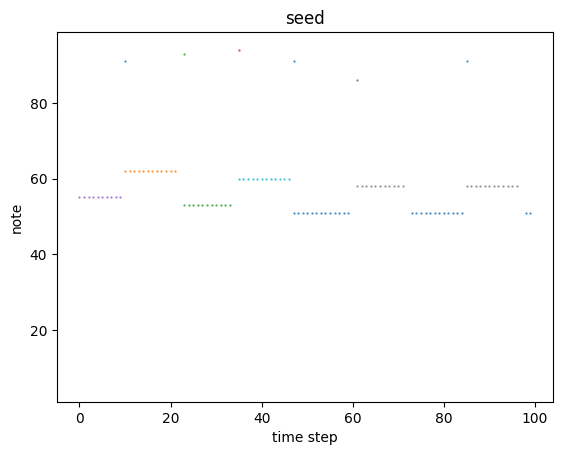

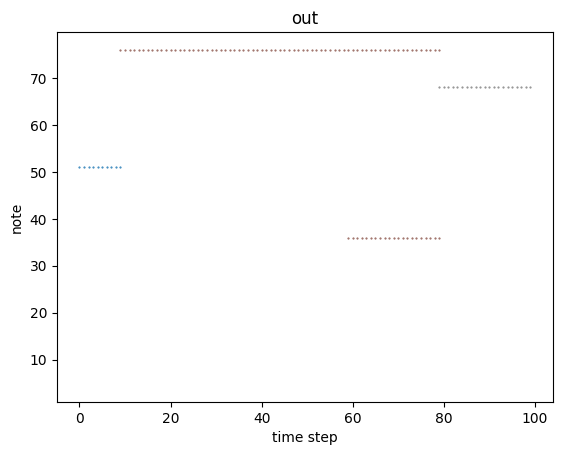

In [298]:
def generate(model, seed, length):
    """
    """
    print(f'current seed length: {seed.shape[0]}')
    pred = model(seed, seed[-1:])
    # pred = torch.sigmoid(pred)
    # pred = torch.where(pred > 0.5, 1, 0).type(torch.float32)
    pred = torch.softmax(pred, 1)
    pred = torch.where(pred > 0.1, 1, 0).type(torch.float32)

    out = pred

    while out.shape[0] < length:

        pred = model(seed, pred)
        # pred = torch.sigmoid(pred)
        # pred = torch.where(pred > 0.5, 1, 0).type(torch.float32)

        pred = torch.softmax(pred, 1)
        pred = torch.where(pred > 0.1, 1, 0).type(torch.float32)

        seed = torch.cat((seed, pred))
        seed = seed[1:]

        out = torch.cat((out, pred))

        print(f'current prediction length: {out.shape[0]}', end='\r')
    print(f'current prediction length: {out.shape[0]}')
    return out

piano_roll, tempo, resolution = parseMidi(touhou_bad_apple)
piano_roll = torch.tensor(piano_roll).type(torch.float32)

seed = piano_roll[-300:-200]

out = generate(model, seed, 100)

display_piano_roll(seed.detach().numpy(), "seed")
display_piano_roll(out.detach().numpy(), "out")

In [283]:
prediction = torch.cat((seed, out))
outputMidi('out.midi', prediction.cpu().detach().numpy(), tempo=tempo, resolution=resolution)
play_midi('out.midi', 'out')

<ipython-input-12-34c6fcfb6e0f>:41: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  message = note_events[delta[i] > 0]


In [311]:
model.eval()
song = touhou_bad_apple
print(f'song : {song}')
piano_roll, tempo, resolution = parseMidi(song)
X, T = createTrainData([piano_roll], 1000, 1000)
x = torch.from_numpy(X[0]).type(torch.float32)
# t = torch.from_numpy(X[0][-1:]).type(torch.float32)
t = torch.from_numpy(T[0]).type(torch.float32)
# t = torch.cat((x[-1:,:], t))
device = 'cuda' if torch.cuda.is_available()  else 'cpu'
if 'cuda' in device:
    x, t = x.pin_memory().to(device, non_blocking=True), t.pin_memory().to(device, non_blocking=True)
else:
    x, t = x.to(device), t.to(device)

# print(f'x.shape : {x.shape}')
# print(f't.shape : {t.shape}')


song : /root/.cache/kagglehub/datasets/hansespinosa2/nin-video-game-midis/versions/2/nin_midi_files/nin_midi_files/Other/PC/Touhou4LotusLandStory/BadApple.mid


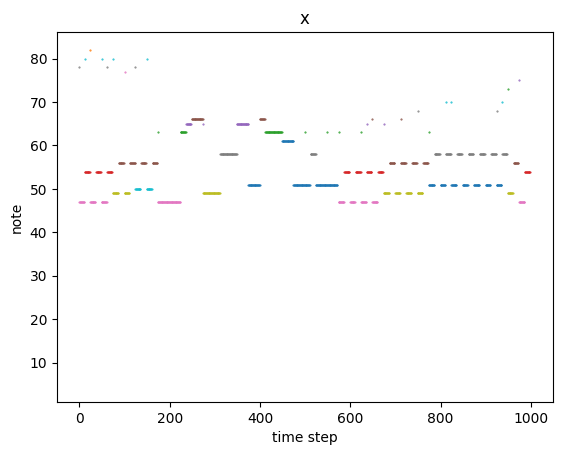

<ipython-input-12-34c6fcfb6e0f>:41: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  message = note_events[delta[i] > 0]


In [306]:
display_piano_roll(x.cpu().detach().numpy(), 'x')
outputMidi('x.midi', t.cpu().detach().numpy(), tempo=tempo, resolution=resolution)
play_midi('x.midi', 'x')

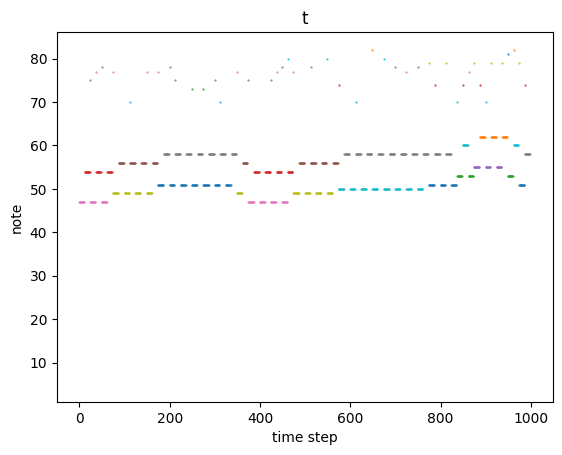

<ipython-input-12-34c6fcfb6e0f>:41: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  message = note_events[delta[i] > 0]


In [309]:
display_piano_roll(t.cpu().detach().numpy(), 't')
outputMidi('t.midi', t.cpu().detach().numpy(), tempo=tempo, resolution=resolution)
play_midi('t.midi', 't')

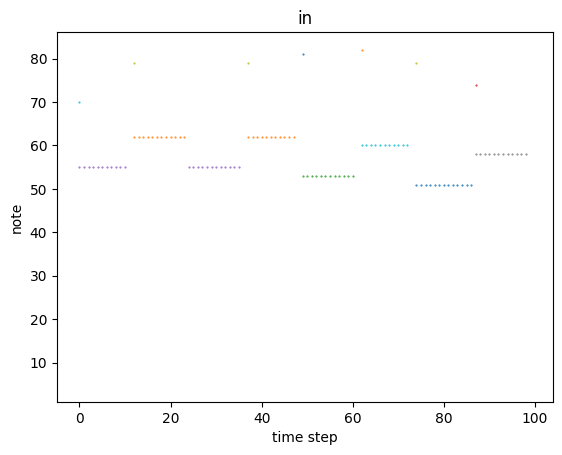

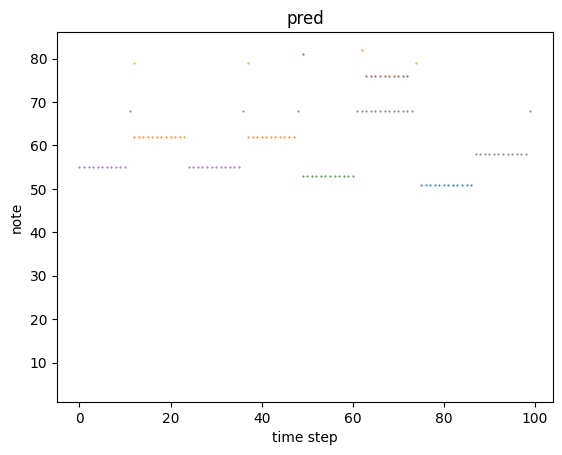

<ipython-input-12-34c6fcfb6e0f>:41: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  message = note_events[delta[i] > 0]


In [310]:
new_pred = t[-100:]
display_piano_roll(new_pred.cpu().detach().numpy(), 'in')

mask = torch.tril(torch.ones(new_pred.shape[0], new_pred.shape[0]) == 1)  # Lower triangular matrix
mask = mask.float()
mask = mask.masked_fill(mask == 0, float('-inf'))  # Convert zeros to -inf
mask = mask.masked_fill(mask == 1, float(0.0))  # Convert ones to 0

new_pred = model(x, new_pred)
new_pred = torch.softmax(new_pred, 1)
new_pred = torch.where(new_pred > 0.1, 1 ,0).type(torch.float32)
# new_pred = torch.sigmoid(new_pred)
# new_pred = torch.where(new_pred > 0.5, 1 ,0).type(torch.float32)


display_piano_roll(new_pred.cpu().detach().numpy(), 'pred')
outputMidi('tmp.midi', new_pred.cpu().detach().numpy(), tempo=tempo, resolution=resolution)
play_midi('tmp.midi')